In [1]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport

import matplotlib.pyplot as plt

In [2]:
def load_bid_log(file,skip = True):
    
    s = file[5:10]
    if skip:
        df_raw = pd.read_csv(file)
    else:
        df_raw = pd.read_csv(file,skiprows =0)
    # df.info()

    df = df_raw.copy()
#     'Project Description',
    if skip:
        df =df[['Project Name','City','Local','Project Type','Bid Type','Design Type','Estimator','DEPT',' Base Bid ','Bid Status']]
    else:
        df =df[['Project Name','City','Local','Project Type','Bid Type','Design Type','Estimator','DEPT','  Base Bid  ','Bid Status']]
    is_NaN = df.isnull()
    row_has_NaN = is_NaN.any(axis=1)
    rows_with_NaN = df[row_has_NaN]
#     print(rows_with_NaN)
    return df,s

In [4]:
yearly_bid_data=[]

In [4]:
def pipe(df,s, f = False):
    df.dropna(inplace =True)
    
        
    df.drop(df[df['Bid Status']== 'Not Bid'].index,inplace =True)
    if f:
        df.drop(df[df['  Base Bid  ']== '-'].index,inplace =True)
        df['  Base Bid  ']=(df['  Base Bid  '].str.strip('$ \n'))
        df['  Base Bid  ']= df['  Base Bid  '].apply(lambda x: int(x.replace(',','')))
        df[' Base Bid '] = df['  Base Bid  ']
        df.drop(['  Base Bid  '],axis = 1, inplace = True)
    else:
        df.drop(df[df[' Base Bid ']== '-'].index,inplace =True)

        df[' Base Bid ']=(df[' Base Bid '].str.strip('$ \n'))
        df[' Base Bid ']= df[' Base Bid '].apply(lambda x: int(x.replace(',','')))
    
    tit= s + 'Pandas Profiling Report'
    print(tit)
    return  ProfileReport(df, title=tit, html={'style':{'full_width':True}}), df

In [5]:

df, s = load_bid_log('2020 Bid Log.csv')
df.columns

Index(['Project Name', 'City', 'Local', 'Project Type', 'Bid Type',
       'Design Type', 'Estimator', 'DEPT', ' Base Bid ', 'Bid Status'],
      dtype='object')

In [7]:
profile_2020,data_20 = pipe(df,s)


Bid LPandas Profiling Report


In [8]:
profile_2020


Summarize dataset: 25it [00:12,  2.04it/s, Completed]                                             
Render HTML: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


In [15]:
bid2020 = data_20[(data_20['Bid Status'] =='Pending')|(data_20['Bid Status'] =='Bidding')]
clean2020 = bid2020.dropna()
clean2020


,Project Name,City,Local,Project Type,Bid Type,Design Type,Estimator,DEPT,Base Bid,Bid Status
2,Barlow Respiratory Hospital,Los Angeles,11 LA,Hospital,Budget,Engineered,Frank,Est.,1381468,Pending
4,"B|Braun Medical, Re-work",Irvine,441 OC,Industrial,Select Bid List,Design/Build,Brian,S.P.,39293,Pending
13,Samueli Gym & Fields Design Phase,Santa Ana,441 OC,Specialty,Select Bid List,Design/Build,Frank,Est.,58771,Pending
15,Blizzard B16 - QA New Furniture,Irvine,441 OC,TI,Budget,Engineered,Frank,Est.,29224,Pending
18,Hill-Rom rework lighitng controls,Irvine,441 OC,TI,Select Bid List,Design/Build,Doyle,S.P.,12600,Pending
...,...,...,...,...,...,...,...,...,...,...
225,Hoag Sand Canyon MOB Lighitng Repair,Irvine,441 OC,TI,Select Bid List,Design/ Assist,Doyle,S.P.,895,Pending
226,Hoag Newport Cancer Center transformer replace...,Newport Beach,441 OC,Hospital,Select Bid List,Design/ Assist,Doyle,S.P.,45934,Pending
228,Smartstop add oultets on wall,Ladera Ranch,441 OC,TI,Select Bid List,Design/Build,Doyle,S.P.,3254,Pending
229,Sazerac power for IDF and MDF for Datacom,Carson,441 OC,Industrial,Select Bid List,Design/Build,Doyle,S.P.,19163,Pending


In [16]:
clean2020.to_csv('bid2020.csv')

In [6]:

df, s = load_bid_log('2010 Bid Log.csv')
df.columns

Index(['Project Name', 'City', 'Local', 'Project Type', 'Bid Type',
       'Design Type', 'Estimator', 'DEPT', ' Base Bid ', 'Bid Status'],
      dtype='object')

In [7]:
profile_2010,data_10 = pipe(df,s)
yearly_bid_data.append(data_10)

Bid LPandas Profiling Report


In [8]:

df, s = load_bid_log('2011 Bid Log.csv')
df.columns

Index(['Project Name', 'City', 'Local', 'Project Type', 'Bid Type',
       'Design Type', 'Estimator', 'DEPT', ' Base Bid ', 'Bid Status'],
      dtype='object')

In [10]:
profile_2011,data_11 = pipe(df,s)
yearly_bid_data.append(data_11)

Bid LPandas Profiling Report


In [11]:

df, s = load_bid_log('2012 Bid Log.csv')
df.columns

Index(['Project Name', 'City', 'Local', 'Project Type', 'Bid Type',
       'Design Type', 'Estimator', 'DEPT', ' Base Bid ', 'Bid Status'],
      dtype='object')

In [13]:
profile_2012,data_12 = pipe(df,s)
yearly_bid_data.append(data_12)

Bid LPandas Profiling Report


In [14]:
# dropping useful data


df, s = load_bid_log('2013 Bid Log.csv')
df.columns

Index(['Project Name', 'City', 'Local', 'Project Type', 'Bid Type',
       'Design Type', 'Estimator', 'DEPT', ' Base Bid ', 'Bid Status'],
      dtype='object')

In [15]:
profile_2013,data_13 = pipe(df,s)
yearly_bid_data.append(data_13)


Bid LPandas Profiling Report


In [16]:
# dropping useful data


df, s = load_bid_log('2014 Bid Log.csv')
df.columns

Index(['Project Name', 'City', 'Local', 'Project Type', 'Bid Type',
       'Design Type', 'Estimator', 'DEPT', ' Base Bid ', 'Bid Status'],
      dtype='object')

In [18]:
profile_2014,data_14 = pipe(df,s)
yearly_bid_data.append(data_14)


Bid LPandas Profiling Report


In [19]:
# dropping useful data


df, s = load_bid_log('2015 Bid Log.csv',False)

In [21]:
profile_2015,data_15 = pipe(df,s,True)
yearly_bid_data.append(data_15)

Bid LPandas Profiling Report


In [22]:
# dropping useful data

df,s = load_bid_log('2016 Bid Log.csv')


In [23]:
profile_2016,data_16 = pipe(df,s)
yearly_bid_data.append(data_16)

Bid LPandas Profiling Report


In [24]:
df,s = load_bid_log('2017 Bid Log.csv')
df.head()

,Project Name,City,Local,Project Type,Bid Type,Design Type,Estimator,DEPT,Base Bid,Bid Status
0,Block 800,Irvine,441 OC,Comercial,Select Bid List,Engineered,Steve,Est.,"$2,037,838",Awarded
1,Hoag Tustin MOB,Tustin,441 OC,Shell,Select Bid List,Engineered,Brian,Est.,"$294,791",Awarded
2,HHNB CT SCANNER REPLACEMENT,Newport Beach,441 OC,Hospital,Select Bid List,Engineered,Bill,P.M.,"$131,950",Awarded
3,AAA Costa Mesa GFCI Main Test,Costa Mesa,441 OC,TI,Select Bid List,Design/Build,Doyle,S.P.,"$4,940",Unknown
4,HHNB IR Single Plane Replacement,Newport Beach,441 OC,Hospital,Select Bid List,Engineered,Steve,Est.,"$91,940",Awarded


In [26]:
profile_2017,data_17 = pipe(df,s)
yearly_bid_data.append(data_17)

Bid LPandas Profiling Report


In [27]:
df,s = load_bid_log('2018 Bid Log.csv')
df.head()


,Project Name,City,Local,Project Type,Bid Type,Design Type,Estimator,DEPT,Base Bid,Bid Status
0,Bbraun Big Warehouse Fans,Irvine,441 OC,Comercial,Select Bid List,Engineered,Doyle,S.P.,"$62,284",Awarded
1,Pathway Capital,Irvine,441 OC,TI,Budget,Design/Build,Brian,Est.,"$1,426,898",Unknown
2,Epson 5th floor conference room relamp,Long Beach,441 OC,TI,Select Bid List,Design/Build,Doyle,S.P.,"$1,770",Awarded
3,Infineon Technology,El Segundo,11 LA,TI,Budget,Design/Build,Frank,Est.,$-,Not Bid
4,Lido new AC for suite 531,Newport Beach,441 OC,TI,Select Bid List,Design/Build,Doyle,S.P.,"$2,997",Pending


In [29]:
profile_2018,data_18 = pipe(df,s)
yearly_bid_data.append(data_18)

Bid LPandas Profiling Report


In [30]:
df,s = load_bid_log('2019 Bid Log.csv')

In [32]:
profile_2019,data_19 = pipe(df,s)
yearly_bid_data.append(data_19)

Bid LPandas Profiling Report


In [57]:
profile_2010


In [61]:
profile_2011
# Apex suite dupilicate
# LA studio

In [65]:
profile_2012

In [68]:
profile_2013

In [72]:
profile_2014
#chapman led retrofit duplicate

In [114]:
profile_2015

In [127]:
profile_2016

In [128]:
profile_2017 

In [142]:
profile_2018

In [130]:
profile_2019

In [33]:
len(yearly_bid_data)

10

In [34]:
yearly_bid_data

[                             Project Name           City     Local  \
 0         SJMC Plaza II Site Improvements     Fullerton    441 OC    
 1              B. Braun Viral Segregation    Los Angeles   441 OC    
 2               Murrieta Education Center       Murrieta   440 RS    
 3                   Chapman Hashinger MCC         Orange   441 OC    
 4                        Tenet Healthcare        Anaheim   441 OC    
 ..                                    ...            ...       ...   
 221          Chpaman Library LED retrofit         Orange   441 OC    
 222                   Hoag Speech Therapy  Newport Beach   441 OC    
 223  Kaiser Downey Pharmacy - Upgrade BMS         Downey    11 LA    
 224       Hoag Med Records - R&R (E) Flex  Newport Beach   441 OC    
 225      Hoag Med Records - Panel Feeders  Newport Beach   441 OC    
 
      Project Type           Bid Type     Design Type   Estimator    DEPT  \
 0           Site    Select Bid List      Engineered        Rudy    E

In [35]:
bid_data = pd.concat(yearly_bid_data)

In [36]:
bid_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2703 entries, 0 to 395
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Project Name  2703 non-null   object
 1   City          2703 non-null   object
 2   Local         2703 non-null   object
 3   Project Type  2703 non-null   object
 4   Bid Type      2703 non-null   object
 5   Design Type   2703 non-null   object
 6   Estimator     2703 non-null   object
 7   DEPT          2703 non-null   object
 8    Base Bid     2703 non-null   int64 
 9   Bid Status    2703 non-null   object
dtypes: int64(1), object(9)
memory usage: 232.3+ KB


In [37]:
bid_data.groupby('Bid Status').count()

,Project Name,City,Local,Project Type,Bid Type,Design Type,Estimator,DEPT,Base Bid
Bid Status,,,,,,,,,
Awarded,1146,1146,1146,1146,1146,1146,1146,1146,1146
Bidding,1,1,1,1,1,1,1,1,1
Lost,621,621,621,621,621,621,621,621,621
Not Built,198,198,198,198,198,198,198,198,198
Pending,177,177,177,177,177,177,177,177,177
Unknown,560,560,560,560,560,560,560,560,560


In [38]:
bid_data['Bid Status'].unique()

array(['Awarded', 'Lost', 'Not Built', 'Unknown', 'Pending', 'Bidding'],
      dtype=object)

In [39]:
bid_data['Bid Status'].replace({'Unknown': 'Lost'},inplace = True)

In [40]:

model_data = bid_data[(bid_data['Bid Status'] =='Awarded')|(bid_data['Bid Status'] =='Lost')]

In [41]:
model_data

,Project Name,City,Local,Project Type,Bid Type,Design Type,Estimator,DEPT,Base Bid,Bid Status
0,SJMC Plaza II Site Improvements,Fullerton,441 OC,Site,Select Bid List,Engineered,Rudy,Est.,41230,Awarded
1,B. Braun Viral Segregation,Los Angeles,441 OC,Industrial,Select Bid List,Engineered,Frank,Est.,141095,Awarded
2,Murrieta Education Center,Murrieta,440 RS,Shell,Competitive,Engineered,Rudy,Est.,1432619,Lost
3,Chapman Hashinger MCC,Orange,441 OC,Comercial,Select Bid List,Design/Build,Doyle,Est.,68920,Awarded
4,Tenet Healthcare,Anaheim,441 OC,TI,Competitive,Engineered,Jody,Est.,63100,Lost
...,...,...,...,...,...,...,...,...,...,...
377,Epson Carson New power for Surepress,Carson,441 OC,TI,Select Bid List,Design/Build,Doyle,S.P.,18932,Awarded
378,Newport Lido 361 Elevator room AC power,Newport Beach,441 OC,TI,Select Bid List,Design/Build,Doyle,S.P.,2800,Awarded
380,"B|Braun Medical, Stability Area Basket tray",Irvine,441 OC,Industrial,Negotiated,Design/Build,Brian,S.P.,24983,Awarded
381,Charter new outlet,Cerritos,441 OC,TI,Select Bid List,Design/Build,Doyle,S.P.,500,Awarded


In [42]:
model_data['Bid Type'].unique()

array([' Select Bid List ', ' Competitive ', ' Negotiated ', ' Budget ',
       ' Public Works ', 'Select Bid List'], dtype=object)

In [43]:
model_data[model_data['Design Type'] =='  Engineered '].index


Int64Index([158], dtype='int64')

In [44]:
model_data.at[303,'Local'] = ' 441 OC '


In [45]:
mod2 =model_data.drop([58,82,158,267, 268, 206,303])
mod2 


,Project Name,City,Local,Project Type,Bid Type,Design Type,Estimator,DEPT,Base Bid,Bid Status
0,SJMC Plaza II Site Improvements,Fullerton,441 OC,Site,Select Bid List,Engineered,Rudy,Est.,41230,Awarded
1,B. Braun Viral Segregation,Los Angeles,441 OC,Industrial,Select Bid List,Engineered,Frank,Est.,141095,Awarded
2,Murrieta Education Center,Murrieta,440 RS,Shell,Competitive,Engineered,Rudy,Est.,1432619,Lost
3,Chapman Hashinger MCC,Orange,441 OC,Comercial,Select Bid List,Design/Build,Doyle,Est.,68920,Awarded
4,Tenet Healthcare,Anaheim,441 OC,TI,Competitive,Engineered,Jody,Est.,63100,Lost
...,...,...,...,...,...,...,...,...,...,...
377,Epson Carson New power for Surepress,Carson,441 OC,TI,Select Bid List,Design/Build,Doyle,S.P.,18932,Awarded
378,Newport Lido 361 Elevator room AC power,Newport Beach,441 OC,TI,Select Bid List,Design/Build,Doyle,S.P.,2800,Awarded
380,"B|Braun Medical, Stability Area Basket tray",Irvine,441 OC,Industrial,Negotiated,Design/Build,Brian,S.P.,24983,Awarded
381,Charter new outlet,Cerritos,441 OC,TI,Select Bid List,Design/Build,Doyle,S.P.,500,Awarded


In [165]:
mod2['Local'].unique()

array([' 441 OC ', ' 440 RS ', ' 11 LA ', ' 477 SB '], dtype=object)

In [156]:
model_data['Design Type'].unique()

array([' Engineered ', ' Design/Build ', ' Design/ Assist ',
       'Design/Build', '  Engineered '], dtype=object)

In [46]:
ProfileReport(mod2, title='model_data ', html={'style':{'full_width':True}})

In [171]:
mod2.to_csv('bid_data2.0.csv')

In [74]:
model_data= mod2

Text(0, 0.5, 'Bid Count')

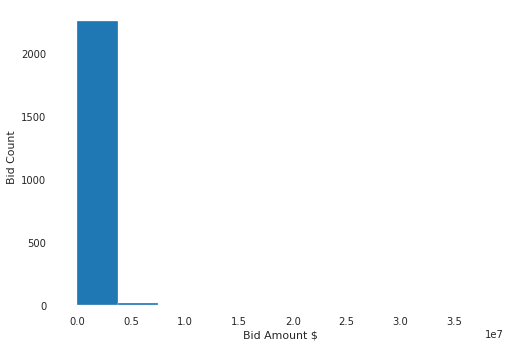

In [83]:

fig, ax = plt.subplots()

# Draw the graph
ax.hist(model_data[" Base Bid "])

# Set the label for the x-axis
ax.set_xlabel("Bid Amount $")

# Set the label for the y-axis
ax.set_ylabel('Bid Count')

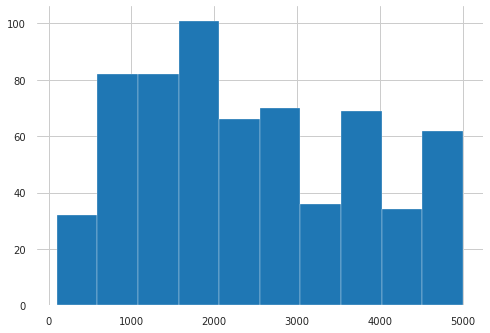

In [84]:
model_data[" Base Bid "].hist(range=[100,5000])

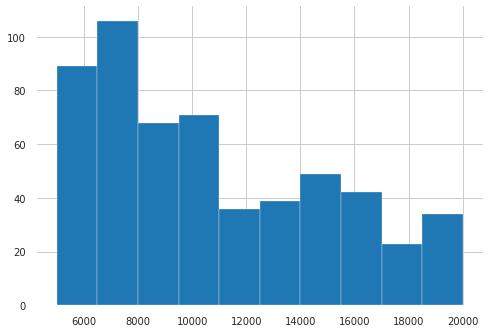

In [85]:
model_data[" Base Bid "].hist(range=[5001,20000])

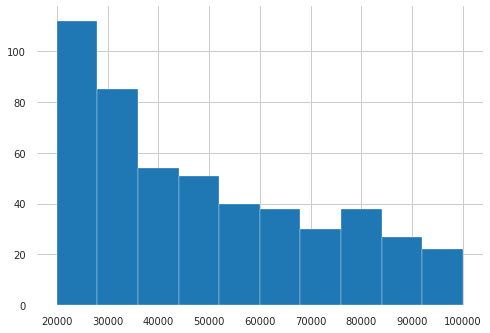

In [86]:
model_data[" Base Bid "].hist(range=[20001,100000])

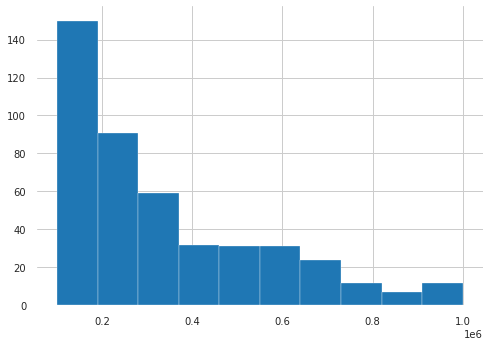

In [87]:
model_data[" Base Bid "].hist(range=[100001,1000000])

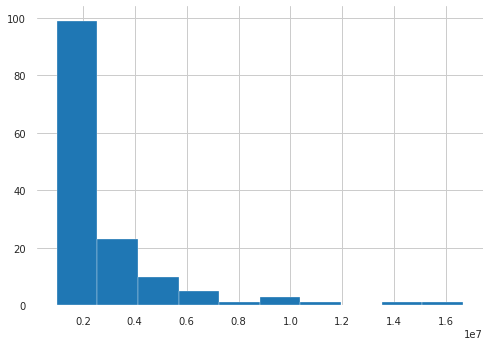

In [88]:
model_data[" Base Bid "].hist(range=[1000001,16635401])

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f06342e7690>,
      dtype=object)

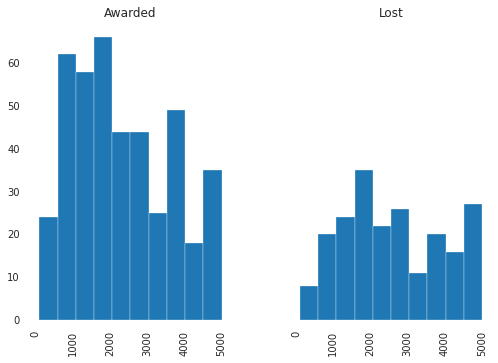

In [89]:
model_data[" Base Bid "].hist(by= model_data['Bid Status'],range =[100,5000],sharey=True)


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f0634223290>,
      dtype=object)

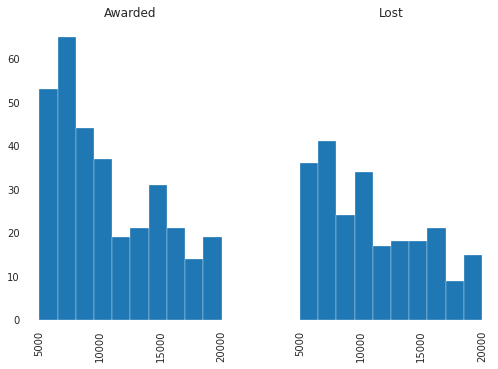

In [90]:
model_data[" Base Bid "].hist(by= model_data['Bid Status'],range =[5001,20000],sharey=True)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f0634512390>,
      dtype=object)

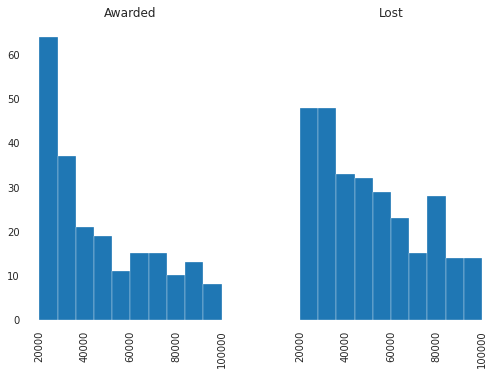

In [91]:
model_data[" Base Bid "].hist(by= model_data['Bid Status'],range =[20001,100000],sharey=True)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f0634113f10>,
      dtype=object)

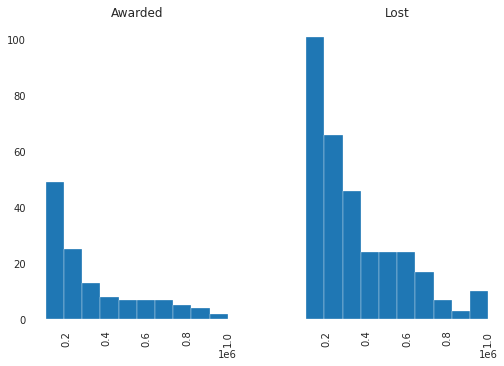

In [92]:
model_data[" Base Bid "].hist(by= model_data['Bid Status'],range =[100001,1000000],sharey=True)

In [93]:
model_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2283 entries, 0 to 387
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Project Name  2283 non-null   object
 1   City          2283 non-null   object
 2   Local         2283 non-null   object
 3   Project Type  2283 non-null   object
 4   Bid Type      2283 non-null   object
 5   Design Type   2283 non-null   object
 6   Estimator     2283 non-null   object
 7   DEPT          2283 non-null   object
 8    Base Bid     2283 non-null   int64 
 9   Bid Status    2283 non-null   object
dtypes: int64(1), object(9)
memory usage: 276.2+ KB


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f0633f16a10>,
      dtype=object)

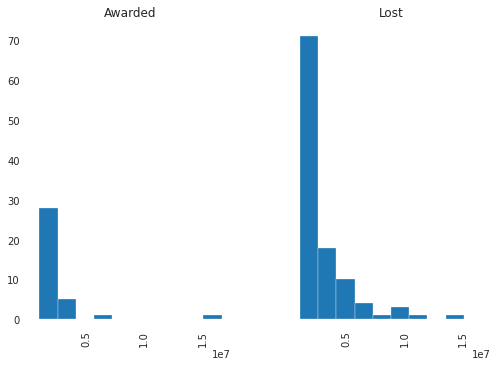

In [94]:
model_data[" Base Bid "].hist(by= model_data['Bid Status'],range =[1000001,16635401],sharey=True)

In [95]:

model_data.groupby(['Estimator','Bid Status']).count()

Project Name  City  Local  Project Type  Bid Type  \
Estimator  Bid Status                                                      
 Bill      Awarded               22    22     22            22        22   
           Lost                   7     7      7             7         7   
 Bill      Awarded               16    16     16            16        16   
           Lost                   5     5      5             5         5   
 Brian     Awarded               88    88     88            88        88   
           Lost                  89    89     89            89        89   
 Dan       Awarded                2     2      2             2         2   
           Lost                   1     1      1             1         1   
 Daniel    Awarded               13    13     13            13        13   
           Lost                  31    31     31            31        31   
 Dean      Awarded               24    24     24            24        24   
           Lost                  15    15     15            15        15   
 Don V     Awarded                3     3      3             3         3   
           Lost                  18    18     18            18        18   
 Doyle     Awarded              616   616    616           616       616   
           Lost                 425   425    425           425       425   
 Frank     Awarded              148   148    148           148       148   
           Lost                 253   253    253           253       253   
 Jeff P.   Awarded               41    41     41            41        41   
           Lost                  48    48     48            48        48   
 Jeff S    Awarded               13    13     13            13        13   
           Lost                  14    14     14            14        14   
 Jeff S.   Awarded                5     5      5             5         5   
           Lost                   2     2      2             2         2   
 Jody      Awarded               16    16     16            16        16   
           Lost                  26    26     26            26        26   
 Randy D.  Awarded                4     4      4             4         4   
           Lost                   3     3      3             3         3   
 Ron       Awarded               16    16     16            16        16   
           Lost                  41    41     41            41        41   
 Rudy      Awarded               49    49     49            49        49   
           Lost                  84    84     84            84        84   
 Steve     Awarded               46    46     46            46        46   
           Lost                  96    96     96            96        96   
 Todd L    Awarded                2     2      2             2         2   
           Lost                   1     1      1             1         1   

                       Design Type  DEPT   Base Bid   
Estimator  Bid Status                                 
 Bill      Awarded              22    22          22  
           Lost                  7     7           7  
 Bill      Awarded              16    16          16  
           Lost                  5     5           5  
 Brian     Awarded              88    88          88  
           Lost                 89    89          89  
 Dan       Awarded               2     2           2  
           Lost                  1     1           1  
 Daniel    Awarded              13    13          13  
           Lost                 31    31          31  
 Dean      Awarded              24    24          24  
           Lost                 15    15          15  
 Don V     Awarded               3     3           3  
           Lost                 18    18          18  
 Doyle     Awarded             616   616         616  
           Lost                425   425         425  
 Frank     Awarded             148   148         148  
           Lost                253   253         253  
 Jeff P.   Awarded              41

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f0633f16650>,
      dtype=object)

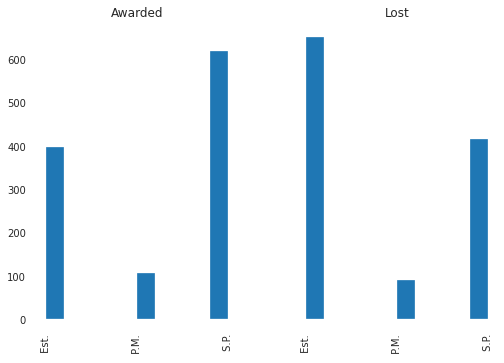

In [96]:

model_data['DEPT'].hist(by= model_data['Bid Status'],sharey = True,sharex=True)

In [97]:
model_data.groupby(['DEPT','Bid Status']).count()

Project Name  City  Local  Project Type  Bid Type  \
DEPT   Bid Status                                                      
 Est.  Awarded              398   398    398           398       398   
       Lost                 652   652    652           652       652   
 P.M.  Awarded              107   107    107           107       107   
       Lost                  90    90     90            90        90   
 S.P.  Awarded              619   619    619           619       619   
       Lost                 417   417    417           417       417   

                   Design Type  Estimator   Base Bid   
DEPT   Bid Status                                      
 Est.  Awarded             398        398         398  
       Lost                652        652         652  
 P.M.  Awarded             107        107         107  
       Lost                 90         90          90  
 S.P.  Awarded             619        619         619  
       Lost                417        417         417

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f0633d9bb50>,
      dtype=object)

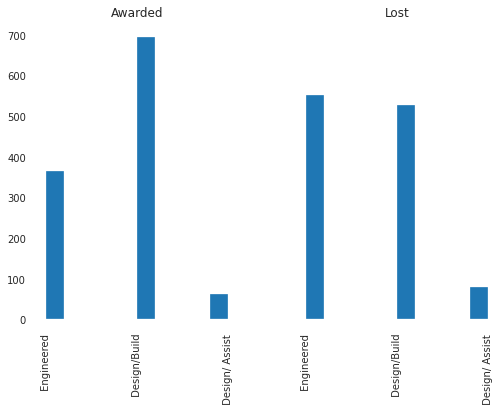

In [98]:
model_data['Design Type'].hist(by= model_data['Bid Status'],sharey = True,sharex=True)

In [99]:
model_data.groupby(['Design Type','Bid Status']).count()

Project Name  City  Local  Project Type  \
Design Type      Bid Status                                            
 Design/ Assist  Awarded               63    63     63            63   
                 Lost                  79    79     79            79   
 Design/Build    Awarded              696   696    696           696   
                 Lost                 528   528    528           528   
 Engineered      Awarded              365   365    365           365   
                 Lost                 552   552    552           552   

                             Bid Type  Estimator  DEPT   Base Bid   
Design Type      Bid Status                                         
 Design/ Assist  Awarded           63         63    63          63  
                 Lost              79         79    79          79  
 Design/Build    Awarded          696        696   696         696  
                 Lost             528        528   528         528  
 Engineered      Awarded          365        365   365         365  
                 Lost             552        552   552         552

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f0633726f10>,
      dtype=object)

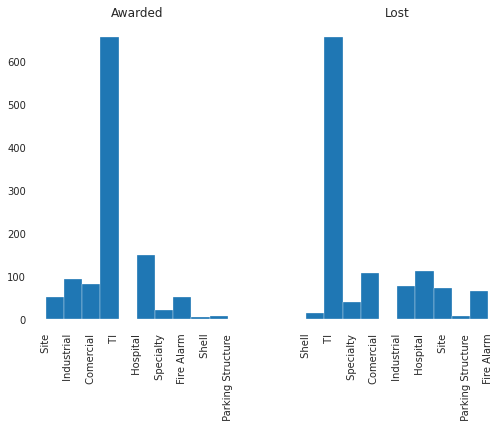

In [121]:
model_data['Project Type'].hist(by= model_data['Bid Status'],sharey = True)

In [101]:
model_data.groupby(['Project Type','Bid Status']).count()

Project Name  City  Local  Bid Type  \
Project Type        Bid Status                                        
 Comercial          Awarded               82    82     82        82   
                    Lost                 108   108    108       108   
 Fire Alarm         Awarded               52    52     52        52   
                    Lost                  66    66     66        66   
 Hospital           Awarded              150   150    150       150   
                    Lost                 113   113    113       113   
 Industrial         Awarded               95    95     95        95   
                    Lost                  78    78     78        78   
 Parking Structure  Awarded                7     7      7         7   
                    Lost                   8     8      8         8   
 Shell              Awarded                5     5      5         5   
                    Lost                  15    15     15        15   
 Site               Awarded               53    53     53        53   
                    Lost                  72    72     72        72   
 Specialty          Awarded               23    23     23        23   
                    Lost                  41    41     41        41   
 TI                 Awarded              657   657    657       657   
                    Lost                 658   658    658       658   

                                Design Type  Estimator  DEPT   Base Bid   
Project Type        Bid Status                                            
 Comercial          Awarded              82         82    82          82  
                    Lost                108        108   108         108  
 Fire Alarm         Awarded              52         52    52          52  
                    Lost                 66         66    66          66  
 Hospital           Awarded             150        150   150         150  
                    Lost                113        113   113         113  
 Industrial         Awarded              95         95    95          95  
                    Lost                 78         78    78          78  
 Parking Structure  Awarded               7          7     7           7  
                    Lost                  8          8     8           8  
 Shell              Awarded               5          5     5           5  
                    Lost                 15         15    15          15  
 Site               Awarded              53         53    53          53  
                    Lost                 72         72    72          72  
 Specialty          Awarded              23         23    23          23  
                    Lost                 41         41    41          41  
 TI                 Awarded             657        657   657         657  
                    Lost                658        658   658         658

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f0633c41ad0>,
      dtype=object)

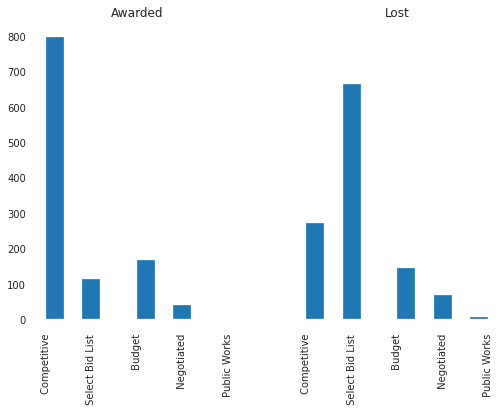

In [102]:
model_data['Bid Type'].hist(by= model_data['Bid Status'],sharey = True,sharex=True)

In [103]:
model_data.groupby(['Bid Type','Bid Status']).count()

Project Name  City  Local  Project Type  \
Bid Type          Bid Status                                            
 Budget           Awarded               41    41     41            41   
                  Lost                 146   146    146           146   
 Competitive      Awarded              114   114    114           114   
                  Lost                 273   273    273           273   
 Negotiated       Awarded              169   169    169           169   
                  Lost                  70    70     70            70   
 Public Works     Awarded                2     2      2             2   
                  Lost                   6     6      6             6   
 Select Bid List  Awarded              798   798    798           798   
                  Lost                 664   664    664           664   

                              Design Type  Estimator  DEPT   Base Bid   
Bid Type          Bid Status                                            
 Budget           Awarded              41         41    41          41  
                  Lost                146        146   146         146  
 Competitive      Awarded             114        114   114         114  
                  Lost                273        273   273         273  
 Negotiated       Awarded             169        169   169         169  
                  Lost                 70         70    70          70  
 Public Works     Awarded               2          2     2           2  
                  Lost                  6          6     6           6  
 Select Bid List  Awarded             798        798   798         798  
                  Lost                664        664   664         664

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f06337e5090>,
      dtype=object)

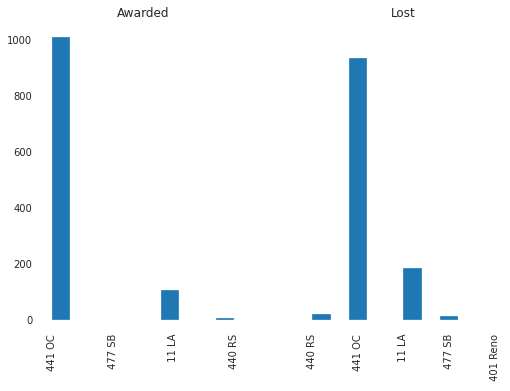

In [120]:
model_data['Local'].hist(by= model_data['Bid Status'],sharey=True)

In [105]:
model_data.groupby(['Local','Bid Status']).count()

Project Name  City  Project Type  Bid Type  \
Local      Bid Status                                               
 11 LA     Awarded              107   107           107       107   
           Lost                 186   186           186       186   
 401 Reno  Lost                   1     1             1         1   
 440 RS    Awarded                7     7             7         7   
           Lost                  22    22            22        22   
 441 OC    Awarded             1008  1008          1008      1008   
           Lost                 936   936           936       936   
 477 SB    Awarded                2     2             2         2   
           Lost                  14    14            14        14   

                       Design Type  Estimator  DEPT   Base Bid   
Local      Bid Status                                            
 11 LA     Awarded             107        107   107         107  
           Lost                186        186   186         186  
 401 Reno  Lost                  1          1     1           1  
 440 RS    Awarded               7          7     7           7  
           Lost                 22         22    22          22  
 441 OC    Awarded            1008       1008  1008        1008  
           Lost                936        936   936         936  
 477 SB    Awarded               2          2     2           2  
           Lost                 14         14    14          14

In [106]:
pd.set_option('display.max_rows', 150)


In [107]:
model_data.groupby(['Design Type','Project Type']).count()

Project Name  City  Local  Bid Type  \
Design Type      Project Type                                               
 Design/ Assist   Comercial                     15    15     15        15   
                  Fire Alarm                     7     7      7         7   
                  Hospital                      21    21     21        21   
                  Industrial                    13    13     13        13   
                  Parking Structure              2     2      2         2   
                  Site                          10    10     10        10   
                  Specialty                      6     6      6         6   
                  TI                            68    68     68        68   
 Design/Build     Comercial                    107   107    107       107   
                  Fire Alarm                     1     1      1         1   
                  Hospital                      62    62     62        62   
                  Industrial                   124   124    124       124   
                  Parking Structure              6     6      6         6   
                  Shell                          2     2      2         2   
                  Site                          77    77     77        77   
                  Specialty                     30    30     30        30   
                  TI                           815   815    815       815   
 Engineered       Comercial                     68    68     68        68   
                  Fire Alarm                   110   110    110       110   
                  Hospital                     180   180    180       180   
                  Industrial                    36    36     36        36   
                  Parking Structure              7     7      7         7   
                  Shell                         18    18     18        18   
                  Site                          38    38     38        38   
                  Specialty                     28    28     28        28   
                  TI                           432   432    432       432   

                                      Estimator  DEPT   Base Bid   Bid Status  
Design Type      Project Type                                                  
 Design/ Assist   Comercial                  15    15          15          15  
                  Fire Alarm                  7     7           7           7  
                  Hospital                   21    21          21          21  
                  Industrial                 13    13          13          13  
                  Parking Structure           2     2           2           2  
                  Site                       10    10          10          10  
                  Specialty                   6     6           6           6  
                  TI                         68    68          68          68  
 Design/Build     Comercial                 107   107         107         107  
                  Fire Alarm                  1     1           1           1  
                  Hospital                   62    62          62          62  
                  Industrial                124   124         124         124  
                  Parking Structure           6     6           6           6  
                  Shell                       2     2           2           2  
                  Site                       77    77          77          77  
                  Specialty                  30    30          30          30  
                  TI                        815   815         815         815  
 Engineered       Comercial                  68    68          68          68  
                  Fire Alarm                110   110         110         110  
                  Hospital                  180   180         180         180  
                  Industrial                 36    36          36          36  
                  Parking Structure      

In [108]:
model_data.groupby(['Design Type','Project Type', 'Bid Status']).count()

Project Name  City  Local  \
Design Type      Project Type        Bid Status                              
 Design/ Assist   Comercial          Awarded                7     7      7   
                                     Lost                   8     8      8   
                  Fire Alarm         Lost                   7     7      7   
                  Hospital           Awarded               12    12     12   
                                     Lost                   9     9      9   
                  Industrial         Awarded                6     6      6   
                                     Lost                   7     7      7   
                  Parking Structure  Awarded                1     1      1   
                                     Lost                   1     1      1   
                  Site               Awarded                4     4      4   
                                     Lost                   6     6      6   
                  Specialty          Awarded                1     1      1   
                                     Lost                   5     5      5   
                  TI                 Awarded               32    32     32   
                                     Lost                  36    36     36   
 Design/Build     Comercial          Awarded               51    51     51   
                                     Lost                  56    56     56   
                  Fire Alarm         Lost                   1     1      1   
                  Hospital           Awarded               37    37     37   
                                     Lost                  25    25     25   
                  Industrial         Awarded               73    73     73   
                                     Lost                  51    51     51   
                  Parking Structure  Awarded                3     3      3   
                                     Lost                   3     3      3   
                  Shell              Awarded                1     1      1   
                                     Lost                   1     1      1   
                  Site               Awarded               42    42     42   
                                     Lost                  35    35     35   
                  Specialty          Awarded               15    15     15   
                                     Lost                  15    15     15   
                  TI                 Awarded              474   474    474   
                                     Lost                 341   341    341   
 Engineered       Comercial          Awarded               24    24     24   
                                     Lost                  44    44     44   
                  Fire Alarm         Awarded               52    52     52   
                                     Lost                  58    58     58   
                  Hospital           Awarded              101   101    101   
                                     Lost                  79    79     79   
                  Industrial         Awarded               16    16     16   
                                     Lost                  20    20     20   
                  Parking Structure  Awarded                3     3      3   
                                     Lost                   4     4      4   
                  Shell              Awarded                4     4      4   
                                     Lost                  14    14     14   
                  Site               Awarded                7     7      7   
                                     Lost                  31    31     31   
                  Specialty          Awarded                7     7      7   
                                     Lost                  21    21     21   
                  TI                 Awarded              151   151    151   
                                     Lost                 281   281    

In [109]:
model_data.groupby(['DEPT','Bid Type']).count()

Project Name  City  Local  Project Type  \
DEPT   Bid Type                                                     
 Est.   Budget                     125   125    125           125   
        Competitive                330   330    330           330   
        Negotiated                 163   163    163           163   
        Public Works                 6     6      6             6   
        Select Bid List            426   426    426           426   
 P.M.   Budget                      18    18     18            18   
        Competitive                 26    26     26            26   
        Negotiated                  21    21     21            21   
        Public Works                 1     1      1             1   
        Select Bid List            131   131    131           131   
 S.P.   Budget                      44    44     44            44   
        Competitive                 31    31     31            31   
        Negotiated                  55    55     55            55   
        Public Works                 1     1      1             1   
        Select Bid List            905   905    905           905   

                          Design Type  Estimator   Base Bid   Bid Status  
DEPT   Bid Type                                                           
 Est.   Budget                    125        125         125         125  
        Competitive               330        330         330         330  
        Negotiated                163        163         163         163  
        Public Works                6          6           6           6  
        Select Bid List           426        426         426         426  
 P.M.   Budget                     18         18          18          18  
        Competitive                26         26          26          26  
        Negotiated                 21         21          21          21  
        Public Works                1          1           1           1  
        Select Bid List           131        131         131         131  
 S.P.   Budget                     44         44          44          44  
        Competitive                31         31          31          31  
        Negotiated                 55         55          55          55  
        Public Works                1          1           1           1  
        Select Bid List           905        905         905         905

In [110]:
model_data.groupby(['DEPT','Bid Type','Bid Status']).count()

Project Name  City  Local  Project Type  \
DEPT   Bid Type          Bid Status                                            
 Est.   Budget           Awarded               20    20     20            20   
                         Lost                 105   105    105           105   
        Competitive      Awarded               92    92     92            92   
                         Lost                 238   238    238           238   
        Negotiated       Awarded              101   101    101           101   
                         Lost                  62    62     62            62   
        Public Works     Awarded                1     1      1             1   
                         Lost                   5     5      5             5   
        Select Bid List  Awarded              184   184    184           184   
                         Lost                 242   242    242           242   
 P.M.   Budget           Awarded                6     6      6             6   
                         Lost                  12    12     12            12   
        Competitive      Awarded               13    13     13            13   
                         Lost                  13    13     13            13   
        Negotiated       Awarded               18    18     18            18   
                         Lost                   3     3      3             3   
        Public Works     Lost                   1     1      1             1   
        Select Bid List  Awarded               70    70     70            70   
                         Lost                  61    61     61            61   
 S.P.   Budget           Awarded               15    15     15            15   
                         Lost                  29    29     29            29   
        Competitive      Awarded                9     9      9             9   
                         Lost                  22    22     22            22   
        Negotiated       Awarded               50    50     50            50   
                         Lost                   5     5      5             5   
        Public Works     Awarded                1     1      1             1   
        Select Bid List  Awarded              544   544    544           544   
                         Lost                 361   361    361           361   

                                     Design Type  Estimator   Base Bid   
DEPT   Bid Type          Bid Status                                      
 Est.   Budget           Awarded              20         20          20  
                         Lost                105        105         105  
        Competitive      Awarded              92         92          92  
                         Lost                238        238         238  
        Negotiated       Awarded             101        101         101  
                         Lost                 62         62          62  
        Public Works     Awarded               1          1           1  
                         Lost                  5          5           5  
        Select Bid List  Awarded             184        184         184  
                         Lost                242        242         242  
 P.M.   Budget           Awarded               6          6           6  
                         Lost                 12         12          12  
        Competitive      Awarded              13         13          13  
                         Lost                 13         13          13  
        Negotiated       Awarded              18         18          18  
                         Lost                  3          3           3  
        Public Works     Lost                  1          1           1  
        Select Bid List  Awarded              70         70          70  
                         Lost                 61         61          61  
 S.P.   Budget           Awarded              15         15          15  
        

In [111]:
model_data.groupby(['DEPT','Project Type']).count()

Project Name  City  Local  Bid Type  Design Type  \
DEPT   Project Type                                                            
 Est.   Comercial                    100   100    100       100          100   
        Fire Alarm                    36    36     36        36           36   
        Hospital                     170   170    170       170          170   
        Industrial                    42    42     42        42           42   
        Parking Structure              8     8      8         8            8   
        Shell                         19    19     19        19           19   
        Site                          42    42     42        42           42   
        Specialty                     45    45     45        45           45   
        TI                           588   588    588       588          588   
 P.M.   Comercial                     10    10     10        10           10   
        Fire Alarm                    82    82     82        82           82   
        Hospital                      52    52     52        52           52   
        Industrial                     3     3      3         3            3   
        Shell                          1     1      1         1            1   
        Site                           1     1      1         1            1   
        Specialty                      6     6      6         6            6   
        TI                            42    42     42        42           42   
 S.P.   Comercial                     80    80     80        80           80   
        Hospital                      41    41     41        41           41   
        Industrial                   128   128    128       128          128   
        Parking Structure              7     7      7         7            7   
        Site                          82    82     82        82           82   
        Specialty                     13    13     13        13           13   
        TI                           685   685    685       685          685   

                            Estimator   Base Bid   Bid Status  
DEPT   Project Type                                            
 Est.   Comercial                 100         100         100  
        Fire Alarm                 36          36          36  
        Hospital                  170         170         170  
        Industrial                 42          42          42  
        Parking Structure           8           8           8  
        Shell                      19          19          19  
        Site                       42          42          42  
        Specialty                  45          45          45  
        TI                        588         588         588  
 P.M.   Comercial                  10          10          10  
        Fire Alarm                 82          82          82  
        Hospital                   52          52          52  
        Industrial                  3           3           3  
        Shell                       1           1           1  
        Site                        1           1           1  
        Specialty                   6           6           6  
        TI                         42          42          42  
 S.P.   Comercial                  80          80          80  
        Hospital                   41          41          41  
        Industrial                128         128         128  
        Parking Structure           7           7           7  
        Site                       82          82          82  
        Specialty                  13          13          13  
        TI                        685         685         685

In [112]:
model_data.groupby(['DEPT','Project Type','Bid Status']).count()

Project Name  City  Local  Bid Type  \
DEPT   Project Type        Bid Status                                        
 Est.   Comercial          Awarded               33    33     33        33   
                           Lost                  67    67     67        67   
        Fire Alarm         Awarded               15    15     15        15   
                           Lost                  21    21     21        21   
        Hospital           Awarded               87    87     87        87   
                           Lost                  83    83     83        83   
        Industrial         Awarded               19    19     19        19   
                           Lost                  23    23     23        23   
        Parking Structure  Awarded                3     3      3         3   
                           Lost                   5     5      5         5   
        Shell              Awarded                5     5      5         5   
                           Lost                  14    14     14        14   
        Site               Awarded                7     7      7         7   
                           Lost                  35    35     35        35   
        Specialty          Awarded               15    15     15        15   
                           Lost                  30    30     30        30   
        TI                 Awarded              214   214    214       214   
                           Lost                 374   374    374       374   
 P.M.   Comercial          Awarded                5     5      5         5   
                           Lost                   5     5      5         5   
        Fire Alarm         Awarded               37    37     37        37   
                           Lost                  45    45     45        45   
        Hospital           Awarded               40    40     40        40   
                           Lost                  12    12     12        12   
        Industrial         Awarded                1     1      1         1   
                           Lost                   2     2      2         2   
        Shell              Lost                   1     1      1         1   
        Site               Awarded                1     1      1         1   
        Specialty          Awarded                1     1      1         1   
                           Lost                   5     5      5         5   
        TI                 Awarded               22    22     22        22   
                           Lost                  20    20     20        20   
 S.P.   Comercial          Awarded               44    44     44        44   
                           Lost                  36    36     36        36   
        Hospital           Awarded               23    23     23        23   
                           Lost                  18    18     18        18   
        Industrial         Awarded               75    75     75        75   
                           Lost                  53    53     53        53   
        Parking Structure  Awarded                4     4      4         4   
                           Lost                   3     3      3         3   
        Site               Awarded               45    45     45        45   
                           Lost                  37    37     37        37   
        Specialty          Awarded                7     7      7         7   
                           Lost                   6     6      6         6   
        TI                 Awarded              421   421    421       421   
                           Lost                 264   264    264       264   

                                       Design Type  Estimator   Base Bid   
DEPT   Project Type        Bid Status                                      
 Est.   Comercial          Awarded              33         33          33  
                           Lost                 67         67     

In [113]:
model_data.groupby(['DEPT','Design Type']).count()

Project Name  City  Local  Project Type  Bid Type  \
DEPT   Design Type                                                           
 Est.   Design/ Assist             32    32     32            32        32   
        Design/Build              326   326    326           326       326   
        Engineered                692   692    692           692       692   
 P.M.   Design/ Assist             20    20     20            20        20   
        Design/Build               32    32     32            32        32   
        Engineered                145   145    145           145       145   
 S.P.   Design/ Assist             90    90     90            90        90   
        Design/Build              866   866    866           866       866   
        Engineered                 80    80     80            80        80   

                         Estimator   Base Bid   Bid Status  
DEPT   Design Type                                          
 Est.   Design/ Assist          32          32          32  
        Design/Build           326         326         326  
        Engineered             692         692         692  
 P.M.   Design/ Assist          20          20          20  
        Design/Build            32          32          32  
        Engineered             145         145         145  
 S.P.   Design/ Assist          90          90          90  
        Design/Build           866         866         866  
        Engineered              80          80          80

In [114]:
model_data.groupby(['DEPT','Design Type','Bid Status']).count()

Project Name  City  Local  Project Type  \
DEPT   Design Type      Bid Status                                            
 Est.   Design/ Assist  Awarded               12    12     12            12   
                        Lost                  20    20     20            20   
        Design/Build    Awarded              141   141    141           141   
                        Lost                 185   185    185           185   
        Engineered      Awarded              245   245    245           245   
                        Lost                 447   447    447           447   
 P.M.   Design/ Assist  Awarded                9     9      9             9   
                        Lost                  11    11     11            11   
        Design/Build    Awarded               15    15     15            15   
                        Lost                  17    17     17            17   
        Engineered      Awarded               83    83     83            83   
                        Lost                  62    62     62            62   
 S.P.   Design/ Assist  Awarded               42    42     42            42   
                        Lost                  48    48     48            48   
        Design/Build    Awarded              540   540    540           540   
                        Lost                 326   326    326           326   
        Engineered      Awarded               37    37     37            37   
                        Lost                  43    43     43            43   

                                    Bid Type  Estimator   Base Bid   
DEPT   Design Type      Bid Status                                   
 Est.   Design/ Assist  Awarded           12         12          12  
                        Lost              20         20          20  
        Design/Build    Awarded          141        141         141  
                        Lost             185        185         185  
        Engineered      Awarded          245        245         245  
                        Lost             447        447         447  
 P.M.   Design/ Assist  Awarded            9          9           9  
                        Lost              11         11          11  
        Design/Build    Awarded           15         15          15  
                        Lost              17         17          17  
        Engineered      Awarded           83         83          83  
                        Lost              62         62          62  
 S.P.   Design/ Assist  Awarded           42         42          42  
                        Lost              48         48          48  
        Design/Build    Awarded          540        540         540  
                        Lost             326        326         326  
        Engineered      Awarded           37         37          37  
                        Lost              43         43          43

In [115]:
model_data.groupby([ 'DEPT','Local','Bid Status']).count()

Project Name  City  Project Type  Bid Type  \
DEPT   Local      Bid Status                                               
 Est.   11 LA     Awarded               58    58            58        58   
                  Lost                 137   137           137       137   
        401 Reno  Lost                   1     1             1         1   
        440 RS    Awarded                6     6             6         6   
                  Lost                  20    20            20        20   
        441 OC    Awarded              333   333           333       333   
                  Lost                 482   482           482       482   
        477 SB    Awarded                1     1             1         1   
                  Lost                  12    12            12        12   
 P.M.   11 LA     Awarded               26    26            26        26   
                  Lost                  31    31            31        31   
        440 RS    Awarded                1     1             1         1   
        441 OC    Awarded               79    79            79        79   
                  Lost                  58    58            58        58   
        477 SB    Awarded                1     1             1         1   
                  Lost                   1     1             1         1   
 S.P.   11 LA     Awarded               23    23            23        23   
                  Lost                  18    18            18        18   
        440 RS    Lost                   2     2             2         2   
        441 OC    Awarded              596   596           596       596   
                  Lost                 396   396           396       396   
        477 SB    Lost                   1     1             1         1   

                              Design Type  Estimator   Base Bid   
DEPT   Local      Bid Status                                      
 Est.   11 LA     Awarded              58         58          58  
                  Lost                137        137         137  
        401 Reno  Lost                  1          1           1  
        440 RS    Awarded               6          6           6  
                  Lost                 20         20          20  
        441 OC    Awarded             333        333         333  
                  Lost                482        482         482  
        477 SB    Awarded               1          1           1  
                  Lost                 12         12          12  
 P.M.   11 LA     Awarded              26         26          26  
                  Lost                 31         31          31  
        440 RS    Awarded               1          1           1  
        441 OC    Awarded              79         79          79  
                  Lost                 58         58          58  
        477 SB    Awarded               1          1           1  
                  Lost                  1          1           1  
 S.P.   11 LA     Awarded              23         23          23  
                  Lost                 18         18          18  
        440 RS    Lost                  2          2           2  
        441 OC    Awarded             596        596         596  
                  Lost                396        396         396  
        477 SB    Lost                  1          1           1

In [116]:
model_data.groupby([ 'Bid Type','Local','Bid Status']).count()

Project Name  City  Project Type  \
Bid Type          Local      Bid Status                                     
 Budget            11 LA     Awarded                6     6             6   
                             Lost                  23    23            23   
                   440 RS    Lost                   4     4             4   
                   441 OC    Awarded               35    35            35   
                             Lost                 116   116           116   
                   477 SB    Lost                   3     3             3   
 Competitive       11 LA     Awarded               12    12            12   
                             Lost                  55    55            55   
                   440 RS    Awarded                1     1             1   
                             Lost                   9     9             9   
                   441 OC    Awarded              100   100           100   
                             Lost                 206   206           206   
                   477 SB    Awarded                1     1             1   
                             Lost                   3     3             3   
 Negotiated        11 LA     Awarded               23    23            23   
                             Lost                  14    14            14   
                   440 RS    Awarded                2     2             2   
                             Lost                   1     1             1   
                   441 OC    Awarded              144   144           144   
                             Lost                  54    54            54   
                   477 SB    Lost                   1     1             1   
 Public Works      11 LA     Lost                   1     1             1   
                   440 RS    Lost                   1     1             1   
                   441 OC    Awarded                2     2             2   
                             Lost                   4     4             4   
 Select Bid List   11 LA     Awarded               66    66            66   
                             Lost                  93    93            93   
                   401 Reno  Lost                   1     1             1   
                   440 RS    Awarded                4     4             4   
                             Lost                   7     7             7   
                   441 OC    Awarded              727   727           727   
                             Lost                 556   556           556   
                   477 SB    Awarded                1     1             1   
                             Lost                   7     7             7   

                                         Design Type  Estimator  DEPT  \
Bid Type          Local      Bid Status                                 
 Budget            11 LA     Awarded               6          6     6   
                             Lost                 23         23    23   
                   440 RS    Lost                  4          4     4   
                   441 OC    Awarded              35         35    35   
                             Lost                116        116   116   
                   477 SB    Lost                  3          3     3   
 Competitive       11 LA     Awarded              12         12    12   
                             Lost                 55         55    55   
                   440 RS    Awarded               1          1     1   
                             Lost                  9          9     9   
                   441 OC    Awarded             100        100   100   
                             Lost                206        206   206   
                   477 SB    Awarded               1          1     1   
                             Lost                  3          3     3   
 Negotiated        11 LA     Awarded              23         23    23   
                           

In [117]:
model_data.groupby([ 'Design Type','Project Type','Bid Status']).count()

Project Name  City  Local  \
Design Type      Project Type        Bid Status                              
 Design/ Assist   Comercial          Awarded                7     7      7   
                                     Lost                   8     8      8   
                  Fire Alarm         Lost                   7     7      7   
                  Hospital           Awarded               12    12     12   
                                     Lost                   9     9      9   
                  Industrial         Awarded                6     6      6   
                                     Lost                   7     7      7   
                  Parking Structure  Awarded                1     1      1   
                                     Lost                   1     1      1   
                  Site               Awarded                4     4      4   
                                     Lost                   6     6      6   
                  Specialty          Awarded                1     1      1   
                                     Lost                   5     5      5   
                  TI                 Awarded               32    32     32   
                                     Lost                  36    36     36   
 Design/Build     Comercial          Awarded               51    51     51   
                                     Lost                  56    56     56   
                  Fire Alarm         Lost                   1     1      1   
                  Hospital           Awarded               37    37     37   
                                     Lost                  25    25     25   
                  Industrial         Awarded               73    73     73   
                                     Lost                  51    51     51   
                  Parking Structure  Awarded                3     3      3   
                                     Lost                   3     3      3   
                  Shell              Awarded                1     1      1   
                                     Lost                   1     1      1   
                  Site               Awarded               42    42     42   
                                     Lost                  35    35     35   
                  Specialty          Awarded               15    15     15   
                                     Lost                  15    15     15   
                  TI                 Awarded              474   474    474   
                                     Lost                 341   341    341   
 Engineered       Comercial          Awarded               24    24     24   
                                     Lost                  44    44     44   
                  Fire Alarm         Awarded               52    52     52   
                                     Lost                  58    58     58   
                  Hospital           Awarded              101   101    101   
                                     Lost                  79    79     79   
                  Industrial         Awarded               16    16     16   
                                     Lost                  20    20     20   
                  Parking Structure  Awarded                3     3      3   
                                     Lost                   4     4      4   
                  Shell              Awarded                4     4      4   
                                     Lost                  14    14     14   
                  Site               Awarded                7     7      7   
                                     Lost                  31    31     31   
                  Specialty          Awarded                7     7      7   
                                     Lost                  21    21     21   
                  TI                 Awarded              151   151    151   
                                     Lost                 281   281    

In [118]:
model

KeyError: '[303] not found in axis'

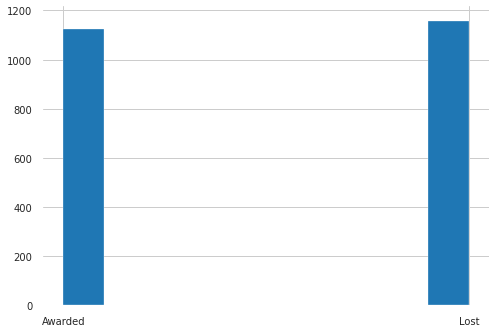

In [123]:
model_data["Bid Status"].hist()

In [124]:
model_data.head()


,Project Name,City,Local,Project Type,Bid Type,Design Type,Estimator,DEPT,Base Bid,Bid Status
0,SJMC Plaza II Site Improvements,Fullerton,441 OC,Site,Select Bid List,Engineered,Rudy,Est.,41230,Awarded
1,B. Braun Viral Segregation,Los Angeles,441 OC,Industrial,Select Bid List,Engineered,Frank,Est.,141095,Awarded
2,Murrieta Education Center,Murrieta,440 RS,Shell,Competitive,Engineered,Rudy,Est.,1432619,Lost
3,Chapman Hashinger MCC,Orange,441 OC,Comercial,Select Bid List,Design/Build,Doyle,Est.,68920,Awarded
4,Tenet Healthcare,Anaheim,441 OC,TI,Competitive,Engineered,Jody,Est.,63100,Lost
